In [2]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd

## **Functions for Image Processing and RGB Analysis**

**trim_image()**

This function trims a specified number of pixels from the top and bottom of an image array. It takes an image array as input along with optional top_trim and bottom_trim parameters to specify how many pixels to remove from each end. Returns the trimmed image array.

**extract_rgb_profile()**

This function extracts RGB color profiles along the y-axis of a BMP image. Key features:
- Processes center 80% strip of image to avoid edge effects
- Filters data using RGB threshold and buffer zones
- Calculates mean RGB values and standard deviations for each row
- Computes relative luminance
- Scales RGB values to target luminance
- Returns arrays for depths, RGB means/standard deviations, luminance, and processed image

**plot_rgb_profile()**

This function creates visualization plots of the RGB analysis results:
- Left panel shows original core image
- Middle panel displays RGB and luminance profiles with standard deviation bands
- Right panel shows standard deviations of RGB and luminance values
- Optional saving of plots as PNG/SVG files
- Customizable figure dimensions and annotations

**stitch_core_sections()**

This function stitches together multiple core sections by:
- Processing RGB profiles for each section
- Adjusting depths to create continuous profile
- Handling buffer zones at section boundaries
- Combining images and data arrays
- Returns stitched arrays for all metrics


In [3]:
def trim_image(img_array, top_trim=0, bottom_trim=0):
    """Trims specified number of pixels from top and bottom of image array.
    
    Args:
        img_array (ndarray): Input image array
        top_trim (int): Number of pixels to trim from top
        bottom_trim (int): Number of pixels to trim from bottom
        
    Returns:
        ndarray: Trimmed image array
    """
    if top_trim + bottom_trim >= img_array.shape[0]:
        raise ValueError("Total trim amount exceeds image height")
        
    return img_array[top_trim:img_array.shape[0]-bottom_trim]

def extract_rgb_profile(image_path, upper_rgb_threshold=100, lower_rgb_threshold=0, buffer=20, top_trim=0, bottom_trim=0, target_luminance=130, bin_size=10, width_start_pct=0.25, width_end_pct=0.75):
    """Extracts RGB values along the y-axis of a BMP image.
    
    Args:
        image_path (str): Path to the BMP image
        upper_rgb_threshold (float): Upper RGB threshold value for data filtering (default 100)
        lower_rgb_threshold (float): Lower RGB threshold value to exclude extreme data (default 0)
        buffer (int): Number of buffer pixels above and below filtered regions (default 20)
        top_trim (int): Number of pixels to trim from top
        bottom_trim (int): Number of pixels to trim from bottom
        target_luminance (float): Target mean luminance value to scale to (default 100)
        bin_size (int): Size of bins in pixels for averaging RGB values (default 10)
        width_start_pct (float): Starting percentage of width for analysis strip (default 0.25)
        width_end_pct (float): Ending percentage of width for analysis strip (default 0.75)
        
    Returns:
        tuple: (depths_pixels, r_values, g_values, b_values) arrays of RGB values
    """
    # Open image and convert to numpy array
    img = Image.open(image_path)
    img_array = np.array(img, dtype=float)
    
    # Trim image
    img_array = trim_image(img_array, top_trim, bottom_trim)
    
    # Get image dimensions
    height = img_array.shape[0]
    width = img_array.shape[1]
    
    # Get strip based on specified width percentages
    center_start = int(width * width_start_pct)
    center_end = int(width * width_end_pct)
    center_strip = img_array[:, center_start:center_end]
    
    # Calculate number of bins
    num_bins = height // bin_size
    if height % bin_size != 0:
        num_bins += 1
    
    # Initialize arrays for binned values
    r_means = np.zeros(num_bins)
    g_means = np.zeros(num_bins)
    b_means = np.zeros(num_bins)
    r_stds = np.zeros(num_bins)
    g_stds = np.zeros(num_bins)
    b_stds = np.zeros(num_bins)
    lum_means = np.zeros(num_bins)
    lum_stds = np.zeros(num_bins)
    
    # Process each bin
    for i in range(num_bins):
        start_idx = i * bin_size
        end_idx = min((i + 1) * bin_size, height)
        
        # Calculate mean RGB values for this bin
        r_means[i] = np.nanmean(center_strip[start_idx:end_idx, :, 0])
        g_means[i] = np.nanmean(center_strip[start_idx:end_idx, :, 1])
        b_means[i] = np.nanmean(center_strip[start_idx:end_idx, :, 2])
        
        # Calculate standard deviations for this bin
        r_stds[i] = np.nanstd(center_strip[start_idx:end_idx, :, 0])
        g_stds[i] = np.nanstd(center_strip[start_idx:end_idx, :, 1])
        b_stds[i] = np.nanstd(center_strip[start_idx:end_idx, :, 2])
        
        # Calculate luminance for this bin
        r_values = center_strip[start_idx:end_idx, :, 0]
        g_values = center_strip[start_idx:end_idx, :, 1]
        b_values = center_strip[start_idx:end_idx, :, 2]
        luminance = 0.2126 * r_values + 0.7152 * g_values + 0.0722 * b_values
        
        lum_means[i] = np.nanmean(luminance)
        lum_stds[i] = np.nanstd(luminance)
    
    # Create mask where 2 or more RGB values exceed upper threshold or are below lower threshold
    over_threshold = np.array([r_means > upper_rgb_threshold, g_means > upper_rgb_threshold, b_means > upper_rgb_threshold])
    under_threshold = np.array([r_means < lower_rgb_threshold, g_means < lower_rgb_threshold, b_means < lower_rgb_threshold])
    
    mask_over = np.sum(over_threshold, axis=0) >= 2
    mask_under = np.sum(under_threshold, axis=0) >= 2
    mask = np.logical_or(mask_over, mask_under)
    
    # Add buffer zones above and below masked regions
    buffer_size = buffer // bin_size  # Adjust buffer size for binned data
    buffered_mask = np.copy(mask)
    for i in range(len(mask)):
        if mask[i]:
            start = max(0, i - buffer_size)
            end = min(len(mask), i + buffer_size + 1)
            buffered_mask[start:end] = True
    
    # Add nan values to top and bottom quarter of buffer size
    quarter_buffer = buffer_size //2
    buffered_mask[:quarter_buffer] = True  # Top
    buffered_mask[-quarter_buffer:] = True  # Bottom
    
    # Apply buffered mask to means and standard deviations
    r_means[buffered_mask] = np.nan
    g_means[buffered_mask] = np.nan
    b_means[buffered_mask] = np.nan
    r_stds[buffered_mask] = np.nan
    g_stds[buffered_mask] = np.nan
    b_stds[buffered_mask] = np.nan
    lum_means[buffered_mask] = np.nan
    lum_stds[buffered_mask] = np.nan
    
    # Rescale RGB values to target luminance
    scale_factor = target_luminance / np.nanmean(lum_means)
    r_means *= scale_factor
    g_means *= scale_factor
    b_means *= scale_factor
    lum_means *= scale_factor
    
    # Scale the image array accordingly
    img_array = img_array * scale_factor
    
    # Create depths array (center points of bins)
    depths_pixels = np.arange(bin_size//2, height, bin_size)
    if len(depths_pixels) < num_bins:
        depths_pixels = np.append(depths_pixels, height - bin_size//2)
        
    # Create widths array (center points of bins)
    widths_pixels = np.arange(bin_size//2, img_array.shape[1], bin_size)
    if len(widths_pixels) < num_bins:
        widths_pixels = np.append(widths_pixels, img_array.shape[1] - bin_size//2)
    
    return depths_pixels, widths_pixels, r_means, g_means, b_means, r_stds, g_stds, b_stds, lum_means, lum_stds, img_array

def plot_rgb_profile(depths, r, g, b, r_std, g_std, b_std, lum, lum_std, img, core_name=None, save_figs=False, output_dir=None):
    # Create figure with three subplots side by side
    height_to_width_ratio = 2 * img.shape[0] / img.shape[1]
    fig, (ax1, ax2, ax3) = plt.subplots(
        1, 3, figsize=(7, height_to_width_ratio),
        gridspec_kw={'width_ratios': [1, 0.7, 0.3], 'wspace': 0.22}
    )

    # Plot the image on the left subplot
    img_normalized = img / 255.0  # Normalize image data to [0,1] range
    ax1.imshow(img_normalized)
    ax1.set_xticks([])  # Remove x-axis ticks
    ax1.set_ylabel('Depth (pixels)')

    # Plot RGB profiles with standard deviation bands in middle subplot
    ax2.fill_betweenx(depths, lum - lum_std, lum + lum_std, color='black', alpha=0.2, linewidth=0)
    ax2.fill_betweenx(depths, r - r_std, r + r_std, color='red', alpha=0.2, linewidth=0)
    ax2.fill_betweenx(depths, g - g_std, g + g_std, color='green', alpha=0.2, linewidth=0)
    ax2.fill_betweenx(depths, b - b_std, b + b_std, color='blue', alpha=0.1, linewidth=0)

    ax2.plot(r, depths, 'r-', label='Red', linewidth=0.4)
    ax2.plot(g, depths, 'g-', label='Green', linewidth=0.4)
    ax2.plot(b, depths, 'b-', label='Blue', linewidth=0.4)
    ax2.plot(lum, depths, 'k--', label='Relative\nLuminance', linewidth=1)

    # Set x-axis limits based on RGB value range only
    rgb_min = np.nanmin([r, g, b])
    rgb_max = np.nanmax([r, g, b])
    padding = (rgb_max - rgb_min) * 0.15  # Add 20% padding
    ax2.set_xlim(rgb_min - padding, rgb_max + padding)

    ax2.invert_yaxis()  # Invert y-axis to match image orientation
    ax2.set_ylim(max(depths), min(depths))  # Invert y-axis limits
    ax2.set_yticklabels([])
    ax2.set_xlabel('Color Intensity')
    ax2.legend(fontsize='x-small', loc='upper left')
    ax2.grid(True)

    # Plot standard deviations in right subplot
    ax3.plot(r_std, depths, 'r-', label='Red', linewidth=0.4)
    ax3.plot(g_std, depths, 'g-', label='Green', linewidth=0.4)
    ax3.plot(b_std, depths, 'b-', label='Blue', linewidth=0.4)
    ax3.plot(lum_std, depths, 'k--', label='Relative\nLuminance', linewidth=1)

    ax3.set_xlabel('σ (STDEV)')
    ax3.set_ylim(ax2.get_ylim())
    ax3.grid(True)
    ax3.set_yticklabels([])
    ax3.set_xlim(left=0)  # Set x-axis to start at 0

    # Add text annotation if core name is provided
    if core_name:
        fig.text(.5, 0.89, core_name, fontweight='bold', ha='center', va='top')

    plt.show()

    # Save figures if requested
    if save_figs:
        if output_dir is None:
            raise ValueError("output_dir must be provided when save_figs is True")
            
        # Save full figure as PNG and SVG
        output_file = os.path.join(output_dir, f"{core_name}.png")
        fig.savefig(output_file, dpi=300, bbox_inches='tight')
        print(f"RGB profile results saved to: ~/{'/'.join(output_file.split('/')[-2:])}")
        
        output_file = os.path.join(output_dir, f"{core_name}.svg")
        fig.savefig(output_file, bbox_inches='tight')
        print(f"RGB profile image saved to: ~/{'/'.join(output_file.split('/')[-2:])}")
        
        # Save composite TIFF image with compression using PIL
        output_file = os.path.join(output_dir, f"{core_name}.tiff")
        # Clip values to valid range [0,1] and convert to uint8
        img_to_save = np.clip(img_normalized * 255, 0, 255).astype(np.uint8)
        # Convert numpy array to PIL Image
        pil_img = Image.fromarray(img_to_save)
        # Save with ZIP compression
        pil_img.save(output_file, format='TIFF', compression='tiff_deflate')
        print(f"Core composite image saved to: ~/{'/'.join(output_file.split('/')[-2:])}")


def stitch_core_sections(core_structure, mother_dir, stitchbuffer=10, width_start_pct=0.25, width_end_pct=0.75):
    """
    Stitches multiple core sections together by processing RGB profiles and combining images.
    
    Args:
        core_structure (dict): Dictionary containing parameters for each core section
        mother_dir (str): Base directory containing the core images
        
    Returns:
        tuple: Contains arrays of (depths, r, g, b, r_std, g_std, b_std, lum, lum_std, stitched_image)
    """
    # Initialize lists to store data for stitching
    all_depths = []
    all_r = []
    all_g = []
    all_b = []
    all_r_std = []
    all_g_std = []
    all_b_std = []
    all_lum = []
    all_lum_std = []
    all_images = []
    current_depth = 0
    max_width = 0  # Track the maximum width of all images

    # Process each file
    for file_name, params in core_structure.items():
        print(f"\nProcessing {file_name}...")
        image_path = f"{mother_dir}/{file_name}"
        core_name = file_name.split('-image')[0].upper()
        
        # Extract RGB profile with file-specific parameters
        depths, width, r, g, b, r_std, g_std, b_std, lum, lum_std, img = extract_rgb_profile(
            image_path,
            upper_rgb_threshold=params["upper_rgb_threshold"],
            lower_rgb_threshold=params.get("lower_rgb_threshold", 0),
            buffer=params["buffer"],
            top_trim=params["top_trim"],
            bottom_trim=params["bottom_trim"],
            target_luminance=params["target_luminance"],
            width_start_pct=width_start_pct, 
            width_end_pct=width_end_pct
        )
        
        # Plot individual section
        plot_rgb_profile(depths, r, g, b, r_std, g_std, b_std, lum, lum_std, img, core_name=core_name)
        
        # Adjust depths to continue from previous section
        adjusted_depths = depths + current_depth
        current_depth = adjusted_depths[-1]
        print(f"\nTrimmed core length {max(depths)} (pixels), width {max(width)} (pixels)")
        
        # Keep track of the maximum width
        if img.shape[1] > max_width:
            max_width = img.shape[1]
        
        # Append data to lists, removing buffer rows at stitching edges except for first and last sections
        stitchbuffer = stitchbuffer  # Number of bin rows to remove at stitching edges
        if len(all_depths) > 0:  # Not the first section
            # Set last buffer rows of previous section to nan
            for lst in [all_r, all_g, all_b, all_r_std, all_g_std, all_b_std, all_lum, all_lum_std]:
                lst[-stitchbuffer:] = [np.nan] * stitchbuffer
            
            # Skip first buffer rows of current section
            all_depths.extend(adjusted_depths[stitchbuffer:])
            all_r.extend(r[stitchbuffer:])
            all_g.extend(g[stitchbuffer:])
            all_b.extend(b[stitchbuffer:])
            all_r_std.extend(r_std[stitchbuffer:])
            all_g_std.extend(g_std[stitchbuffer:])
            all_b_std.extend(b_std[stitchbuffer:])
            all_lum.extend(lum[stitchbuffer:])
            all_lum_std.extend(lum_std[stitchbuffer:])
        else:  # First section
            all_depths.extend(adjusted_depths)
            all_r.extend(r)
            all_g.extend(g)
            all_b.extend(b)
            all_r_std.extend(r_std)
            all_g_std.extend(g_std)
            all_b_std.extend(b_std)
            all_lum.extend(lum)
            all_lum_std.extend(lum_std)
        
        all_images.append(img)

    # Convert lists to numpy arrays
    all_depths = np.array(all_depths)
    all_r = np.array(all_r)
    all_g = np.array(all_g)
    all_b = np.array(all_b)
    all_r_std = np.array(all_r_std)
    all_g_std = np.array(all_g_std)
    all_b_std = np.array(all_b_std)
    all_lum = np.array(all_lum)
    all_lum_std = np.array(all_lum_std)

    # Resize all images to have the same width before stacking
    resized_images = []
    for img in all_images:
        if img.shape[1] < max_width:
            # Pad the image to match the maximum width
            pad_width = max_width - img.shape[1]
            padded_img = np.pad(img, ((0, 0), (0, pad_width), (0, 0)), mode='constant')
            resized_images.append(padded_img)
        else:
            resized_images.append(img)
    
    # Stitch images vertically
    stitched_image = np.vstack(resized_images)
    
    return (all_depths, all_r, all_g, all_b, all_r_std, all_g_std, 
            all_b_std, all_lum, all_lum_std, stitched_image)


<hr>

### Define cores and source image directories 

In [4]:
# # Example usage:
# # Define cruise and core names
# cruise_name = "M9907"
# core_name = "22PC"
# total_length_cm = 501  # Adjust this value based on actual core length

# target_luminance = 130  # Define target_luminance at the beginning

# mother_dir = f"/Users/larryslai/Library/CloudStorage/Dropbox/My Documents/University of Texas Austin/(Project) NWP turbidites/Cascadia_core_data/OSU_dataset/Image_data/{cruise_name} photos"

# # Define parameters for each file
# core_structure = {
#     f"OSU-{cruise_name}-{core_name}-4-image.bmp": {
#         "upper_rgb_threshold": 120,
#         "lower_rgb_threshold": 0,
#         "buffer": 70,
#         "top_trim": 60,
#         "bottom_trim": 480,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-3-image.bmp": {
#         "upper_rgb_threshold": 100,
#         "lower_rgb_threshold": 0,
#         "buffer": 110,
#         "top_trim": 55,
#         "bottom_trim": 540,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-2-image.bmp": {
#         "upper_rgb_threshold": 100,
#         "lower_rgb_threshold": 0,
#         "buffer": 90,
#         "top_trim": 90,
#         "bottom_trim": 485,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-1-image.bmp": {
#         "upper_rgb_threshold": 100,
#         "lower_rgb_threshold": 0,
#         "buffer": 70,
#         "top_trim": 65,
#         "bottom_trim": 540,
#         "target_luminance": target_luminance
#     }
# }


In [5]:
# # Example usage:
# # Define cruise and core names
# cruise_name = "M9907"
# core_name = "23PC"
# total_length_cm = 783  # Adjust this value based on actual core length

# target_luminance = 130  # Define target_luminance at the beginning

# mother_dir = f"/Users/larryslai/Library/CloudStorage/Dropbox/My Documents/University of Texas Austin/(Project) NWP turbidites/Cascadia_core_data/OSU_dataset/Image_data/{cruise_name} photos"

# # Define parameters for each file
# core_structure = {
#     f"OSU-{cruise_name}-{core_name}-6-image.bmp": {
#         "upper_rgb_threshold": 120,
#         "lower_rgb_threshold": 0,
#         "buffer": 110,
#         "top_trim": 90,
#         "bottom_trim": 550,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-5-image.bmp": {
#         "upper_rgb_threshold": 120,
#         "lower_rgb_threshold": 0,
#         "buffer": 100,
#         "top_trim": 80,
#         "bottom_trim": 550,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-4-image.bmp": {
#         "upper_rgb_threshold": 120,
#         "lower_rgb_threshold": 0,
#         "buffer": 130,
#         "top_trim": 120,
#         "bottom_trim": 530,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-3-image.bmp": {
#         "upper_rgb_threshold": 120,
#         "lower_rgb_threshold": 0,
#         "buffer": 50,
#         "top_trim": 75,
#         "bottom_trim": 530,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-2-image.bmp": {
#         "upper_rgb_threshold": 120,
#         "lower_rgb_threshold": 0,
#         "buffer": 70,
#         "top_trim": 35,
#         "bottom_trim": 575,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-1-image.bmp": {
#         "upper_rgb_threshold": 120,
#         "lower_rgb_threshold": 0,
#         "buffer": 80,
#         "top_trim": 80,
#         "bottom_trim": 500,
#         "target_luminance": target_luminance
#     }
# }


In [6]:
# # Example usage:
# # Define cruise and core names
# cruise_name = "M9907"
# core_name = "23TC"
# total_length_cm = 168  # Adjust this value based on actual core length

# target_luminance = 130  # Define target_luminance at the beginning

# mother_dir = f"/Users/larryslai/Library/CloudStorage/Dropbox/My Documents/University of Texas Austin/(Project) NWP turbidites/Cascadia_core_data/OSU_dataset/Image_data/{cruise_name} photos"

# # Define parameters for each file
# core_structure = {
#     f"OSU-{cruise_name}-{core_name}-2-image.bmp": {
#         "upper_rgb_threshold": 120,
#         "lower_rgb_threshold": 0,
#         "buffer": 60,
#         "top_trim": 72,
#         "bottom_trim": 550,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-1-image.bmp": {
#         "upper_rgb_threshold": 120,
#         "lower_rgb_threshold": 0,
#         "buffer": 30,
#         "top_trim": 97,
#         "bottom_trim": 590,
#         "target_luminance": target_luminance
#     }
# }

In [7]:
# # Example usage:
# # Define cruise and core names
# cruise_name = "M9907"
# core_name = "22TC"
# total_length_cm = 172  # Adjust this value based on actual core length

# target_luminance = 130  # Define target_luminance at the beginning

# mother_dir = f"/Users/larryslai/Library/CloudStorage/Dropbox/My Documents/University of Texas Austin/(Project) NWP turbidites/Cascadia_core_data/OSU_dataset/Image_data/{cruise_name} photos"

# # Define parameters for each file
# core_structure = {
#     f"OSU-{cruise_name}-{core_name}-2-image.bmp": {
#         "upper_rgb_threshold": 120,
#         "lower_rgb_threshold": 0,
#         "buffer": 50,
#         "top_trim": 75,
#         "bottom_trim": 35,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-1-image.bmp": {
#         "upper_rgb_threshold": 120,
#         "lower_rgb_threshold": 0,
#         "buffer": 50,
#         "top_trim": 10,
#         "bottom_trim": 65,
#         "target_luminance": target_luminance
#     }
# }


In [8]:
# Example usage:
# Define cruise and core names
cruise_name = "M9907"
core_name = "25PC"
total_length_cm = 797  # Adjust this value based on actual core length

target_luminance = 130  # Define target_luminance at the beginning

mother_dir = f"/Users/larryslai/Library/CloudStorage/Dropbox/My Documents/University of Texas Austin/(Project) NWP turbidites/Cascadia_core_data/OSU_dataset/Image_data/{cruise_name} photos"

# Define parameters for each file
core_structure = {
    f"OSU-{cruise_name}-{core_name}-6-image.bmp": {
        "upper_rgb_threshold": 170,
        "lower_rgb_threshold": 30,
        "buffer": 60,
        "top_trim": 45,
        "bottom_trim": 120,
        "target_luminance": target_luminance
    },
    f"OSU-{cruise_name}-{core_name}-5-image.bmp": {
        "upper_rgb_threshold": 170,
        "lower_rgb_threshold": 60,
        "buffer": 50,
        "top_trim": 42,
        "bottom_trim": 60,
        "target_luminance": target_luminance
    },
    f"OSU-{cruise_name}-{core_name}-4-image.bmp": {
        "upper_rgb_threshold": 170,
        "lower_rgb_threshold": 30,
        "buffer": 50,
        "top_trim": 95,
        "bottom_trim": 20,
        "target_luminance": target_luminance
    },
    f"OSU-{cruise_name}-{core_name}-3-image.bmp": {
        "upper_rgb_threshold": 170,
        "lower_rgb_threshold": 50,
        "buffer": 50,
        "top_trim": 75,
        "bottom_trim": 65,
        "target_luminance": target_luminance
    },
    f"OSU-{cruise_name}-{core_name}-2-image.bmp": {
        "upper_rgb_threshold": 170,
        "lower_rgb_threshold": 30,
        "buffer": 50,
        "top_trim": 30,
        "bottom_trim": 70,
        "target_luminance": target_luminance
    },
    f"OSU-{cruise_name}-{core_name}-1-image.bmp": {
        "upper_rgb_threshold": 170,
        "lower_rgb_threshold": 30,
        "buffer": 50,
        "top_trim": 30,
        "bottom_trim": 55,
        "target_luminance": target_luminance
    }
}

In [9]:
# # Example usage:
# # Define cruise and core names
# cruise_name = "RR0207"
# core_name = "56PC"
# total_length_cm = 800  # Adjust this value based on actual core length

# target_luminance = 130  # Define target_luminance at the beginning

# mother_dir = f"/Users/larryslai/Library/CloudStorage/Dropbox/My Documents/University of Texas Austin/(Project) NWP turbidites/Cascadia_core_data/OSU_dataset/Image_data/{cruise_name} photos"

# # Define parameters for each file
# core_structure = {
#     f"OSU-{cruise_name}-{core_name}-6-image.tif": {
#         "upper_rgb_threshold": 110,
#         "lower_rgb_threshold": 30,
#         "buffer": 110,
#         "top_trim": 75,
#         "bottom_trim": 520,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-5-image.tif": {
#         "upper_rgb_threshold": 110,
#         "lower_rgb_threshold": 30,
#         "buffer": 90,
#         "top_trim": 35,
#         "bottom_trim": 405,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-4-image.tif": {
#         "upper_rgb_threshold": 110,
#         "lower_rgb_threshold": 0,
#         "buffer": 100,
#         "top_trim": 90,
#         "bottom_trim": 430,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-3-image.tif": {
#         "upper_rgb_threshold": 100,
#         "lower_rgb_threshold": 0,
#         "buffer": 200,
#         "top_trim": 50,
#         "bottom_trim": 435,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-2-image.tif": {
#         "upper_rgb_threshold": 110,
#         "lower_rgb_threshold": 0,
#         "buffer": 150,
#         "top_trim": 60,
#         "bottom_trim": 450,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-1-image.tif": {
#         "upper_rgb_threshold": 100,
#         "lower_rgb_threshold": 0,
#         "buffer": 170,
#         "top_trim": 100,
#         "bottom_trim": 500,
#         "target_luminance": target_luminance
#     }
# }

In [10]:
# # Example usage:
# # Define cruise and core names
# cruise_name = "M9907"
# core_name = "30PC"
# total_length_cm = 748  # Adjust this value based on actual core length

# target_luminance = 130  # Define target_luminance at the beginning

# mother_dir = f"/Users/larryslai/Library/CloudStorage/Dropbox/My Documents/University of Texas Austin/(Project) NWP turbidites/Cascadia_core_data/OSU_dataset/Image_data/{cruise_name} photos"

# # Define parameters for each file
# core_structure = {
#     f"OSU-{cruise_name}-{core_name}-6-image.bmp": {
#         "upper_rgb_threshold": 170,
#         "lower_rgb_threshold": 40,
#         "buffer": 80,
#         "top_trim": 45,
#         "bottom_trim": 500,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-5-image.bmp": {
#         "upper_rgb_threshold": 170,
#         "lower_rgb_threshold": 0,
#         "buffer": 90,
#         "top_trim": 40,
#         "bottom_trim": 530,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-4-image.bmp": {
#         "upper_rgb_threshold": 150,
#         "lower_rgb_threshold": 30,
#         "buffer": 70,
#         "top_trim": 40,
#         "bottom_trim": 500,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-3-image.bmp": {
#         "upper_rgb_threshold": 170,
#         "lower_rgb_threshold": 0,
#         "buffer": 80,
#         "top_trim": 40,
#         "bottom_trim": 545,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-2-image.bmp": {
#         "upper_rgb_threshold": 170,
#         "lower_rgb_threshold": 30,
#         "buffer": 50,
#         "top_trim": 30,
#         "bottom_trim": 560,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-1-image.bmp": {
#         "upper_rgb_threshold": 170,
#         "lower_rgb_threshold": 30,
#         "buffer": 90,
#         "top_trim": 75,
#         "bottom_trim": 535,
#         "target_luminance": target_luminance
#     }
# }

In [11]:
# # Example usage:
# # Define cruise and core names
# cruise_name = "M9907"
# core_name = "31PC"
# total_length_cm = 767  # Adjust this value based on actual core length

# target_luminance = 130  # Define target_luminance at the beginning

# mother_dir = f"/Users/larryslai/Library/CloudStorage/Dropbox/My Documents/University of Texas Austin/(Project) NWP turbidites/Cascadia_core_data/OSU_dataset/Image_data/{cruise_name} photos"

# # Define parameters for each file
# core_structure = {
#     f"OSU-{cruise_name}-{core_name}-6-image.bmp": {
#         "upper_rgb_threshold": 150,
#         "lower_rgb_threshold": 0,
#         "buffer": 70,
#         "top_trim": 50,
#         "bottom_trim": 530,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-5-image.bmp": {
#         "upper_rgb_threshold": 150,
#         "lower_rgb_threshold": 30,
#         "buffer": 70,
#         "top_trim": 70,
#         "bottom_trim": 500,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-4-image.bmp": {
#         "upper_rgb_threshold": 150,
#         "lower_rgb_threshold": 30,
#         "buffer": 50,
#         "top_trim": 95,
#         "bottom_trim": 520,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-3-image.bmp": {
#         "upper_rgb_threshold": 150,
#         "lower_rgb_threshold": 30,
#         "buffer": 100,
#         "top_trim": 60,
#         "bottom_trim": 580,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-2-image.bmp": {
#         "upper_rgb_threshold": 150,
#         "lower_rgb_threshold": 30,
#         "buffer": 100,
#         "top_trim": 55,
#         "bottom_trim": 510,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-1-image.bmp": {
#         "upper_rgb_threshold": 130,
#         "lower_rgb_threshold": 0,
#         "buffer": 80,
#         "top_trim": 20,
#         "bottom_trim": 550,
#         "target_luminance": target_luminance
#     }
# }

In [12]:
# # Example usage:
# # Define cruise and core names
# cruise_name = "M9907"
# core_name = "11PC"
# total_length_cm = 439  # Adjust this value based on actual core length

# target_luminance = 130  # Define target_luminance at the beginning

# mother_dir = f"/Users/larryslai/Library/CloudStorage/Dropbox/My Documents/University of Texas Austin/(Project) NWP turbidites/Cascadia_core_data/OSU_dataset/Image_data/{cruise_name} photos"

# # Define parameters for each file
# core_structure = {
#     f"OSU-{cruise_name}-{core_name}-3-image.bmp": {
#         "upper_rgb_threshold": 150,
#         "lower_rgb_threshold": 00,
#         "buffer": 70,
#         "top_trim": 80,
#         "bottom_trim": 590,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-2-image.bmp": {
#         "upper_rgb_threshold": 150,
#         "lower_rgb_threshold": 0,
#         "buffer": 70,
#         "top_trim": 50,
#         "bottom_trim": 540,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-1-image.bmp": {
#         "upper_rgb_threshold": 150,
#         "lower_rgb_threshold": 0,
#         "buffer": 90,
#         "top_trim": 40,
#         "bottom_trim": 570,
#         "target_luminance": target_luminance
#     }
# }

In [13]:
# # Example usage:
# # Define cruise and core names
# cruise_name = "M9907"
# core_name = "12PC"
# total_length_cm = 488  # Adjust this value based on actual core length

# target_luminance = 130  # Define target_luminance at the beginning

# mother_dir = f"/Users/larryslai/Library/CloudStorage/Dropbox/My Documents/University of Texas Austin/(Project) NWP turbidites/Cascadia_core_data/OSU_dataset/Image_data/{cruise_name} photos"

# # Define parameters for each file
# core_structure = {
#     f"OSU-{cruise_name}-{core_name}-4-image.bmp": {
#         "upper_rgb_threshold": 150,
#         "lower_rgb_threshold": 60,
#         "buffer": 30,
#         "top_trim": 60,
#         "bottom_trim": 550,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-3-image.bmp": {
#         "upper_rgb_threshold": 150,
#         "lower_rgb_threshold": 30,
#         "buffer": 70,
#         "top_trim": 60,
#         "bottom_trim": 500,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-2-image.bmp": {
#         "upper_rgb_threshold": 150,
#         "lower_rgb_threshold": 0,
#         "buffer": 90,
#         "top_trim": 80,
#         "bottom_trim": 570,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-1-image.bmp": {
#         "upper_rgb_threshold": 150,
#         "lower_rgb_threshold": 65,
#         "buffer": 80,
#         "top_trim": 70,
#         "bottom_trim": 555,
#         "target_luminance": target_luminance
#     }
# }

In [14]:
# # Example usage:
# # Define cruise and core names
# cruise_name = "M9907"
# core_name = "14PC"
# total_length_cm = 452  # Adjust this value based on actual core length

# target_luminance = 130  # Define target_luminance at the beginning

# mother_dir = f"/Users/larryslai/Library/CloudStorage/Dropbox/My Documents/University of Texas Austin/(Project) NWP turbidites/Cascadia_core_data/OSU_dataset/Image_data/{cruise_name} photos"

# # Define parameters for each file
# core_structure = {
#     f"OSU-{cruise_name}-{core_name}-3-image.bmp": {
#         "upper_rgb_threshold": 150,
#         "lower_rgb_threshold": 37,
#         "buffer": 50,
#         "top_trim": 130,
#         "bottom_trim": 335,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-2-image.bmp": {
#         "upper_rgb_threshold": 150,
#         "lower_rgb_threshold": 65,
#         "buffer": 70,
#         "top_trim": 50,
#         "bottom_trim": 515,
#         "target_luminance": target_luminance
#     },
#     f"OSU-{cruise_name}-{core_name}-1-image.bmp": {
#         "upper_rgb_threshold": 150,
#         "lower_rgb_threshold": 0,
#         "buffer": 50,
#         "top_trim": 65,
#         "bottom_trim": 525,
#         "target_luminance": target_luminance
#     }
# }

<hr>

### Execusion


Processing OSU-M9907-25PC-6-image.bmp...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.331562527965633].


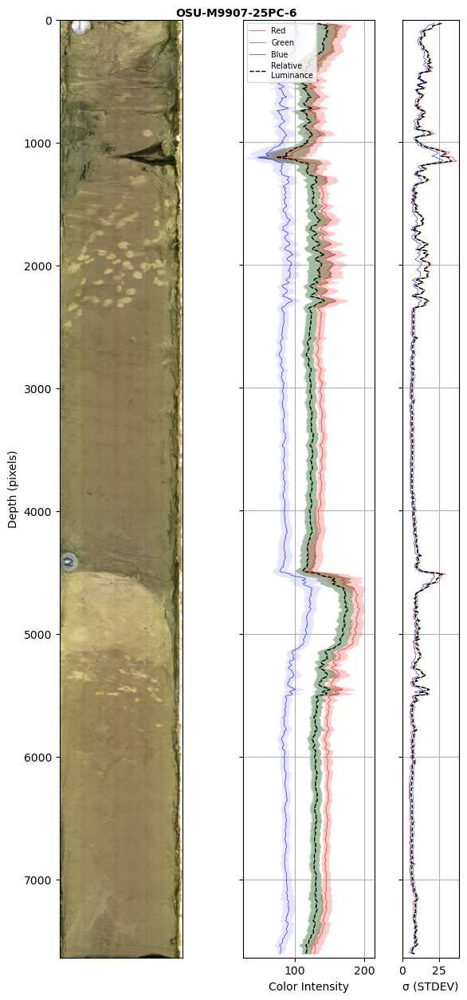


Trimmed core length 7635 (pixels), width 995 (pixels)

Processing OSU-M9907-25PC-5-image.bmp...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.3296089313169162].


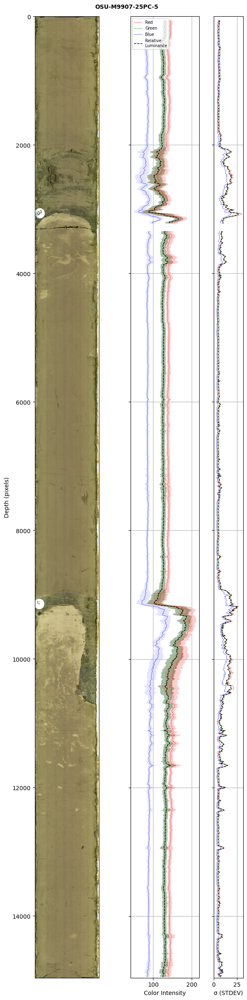


Trimmed core length 14958 (pixels), width 995 (pixels)

Processing OSU-M9907-25PC-4-image.bmp...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.2410970511671817].


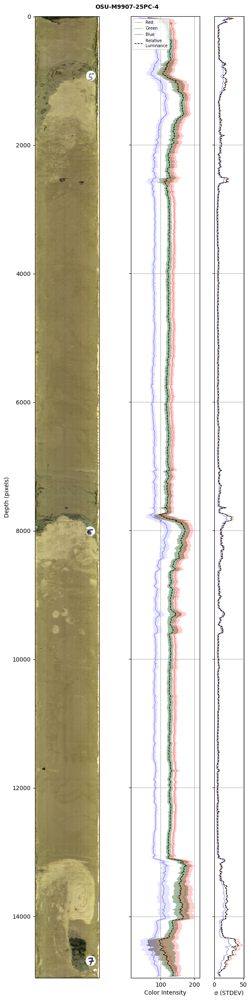


Trimmed core length 14955 (pixels), width 995 (pixels)

Processing OSU-M9907-25PC-3-image.bmp...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.3279952410059854].


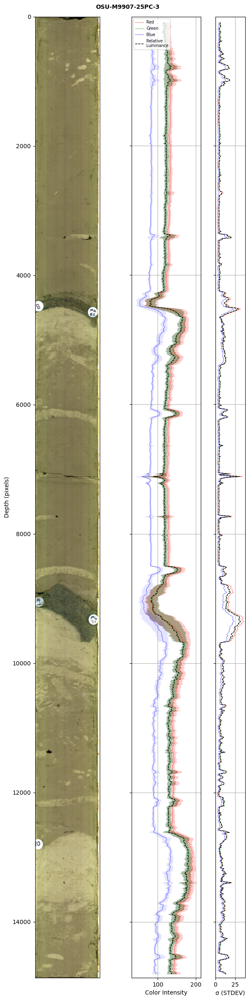


Trimmed core length 14860 (pixels), width 995 (pixels)

Processing OSU-M9907-25PC-2-image.bmp...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.2528291301653598].


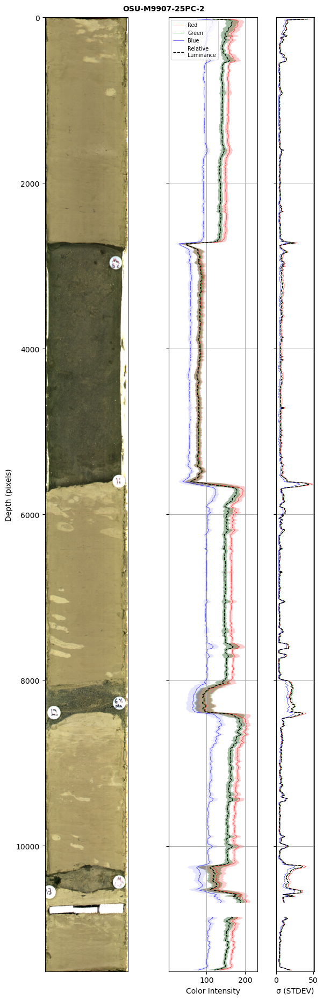


Trimmed core length 11510 (pixels), width 995 (pixels)

Processing OSU-M9907-25PC-1-image.bmp...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.2013822927786613].


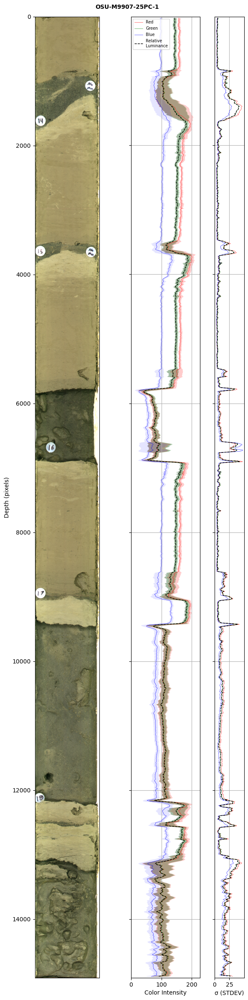


Trimmed core length 14905 (pixels), width 995 (pixels)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.331562527965633].


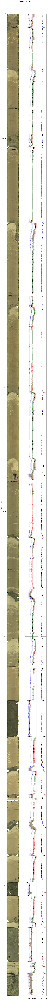

RGB profile results saved to: ~/M9907-25PC/M9907-25PC_RGB.png
RGB profile image saved to: ~/M9907-25PC/M9907-25PC_RGB.svg
Core composite image saved to: ~/M9907-25PC/M9907-25PC_RGB.tiff
RGB data saved to: ~/_compiled_logs/M9907-25PC/M9907-25PC_RGB.csv


In [15]:
# Create output directory if it doesn't exist
output_dir_base = "/Users/larryslai/Library/CloudStorage/Dropbox/My Documents/University of Texas Austin/(Project) NWP turbidites/Cascadia_core_data/OSU_dataset/_compiled_logs"
stitched_core_folder = f"{cruise_name}-{core_name}"
output_dir = os.path.join(output_dir_base, stitched_core_folder)
os.makedirs(output_dir, exist_ok=True)

# Get stitched results
all_depths, all_r, all_g, all_b, all_r_std, all_g_std, all_b_std, all_lum, all_lum_std, stitched_image = stitch_core_sections(core_structure, 
                                                                                                                              mother_dir, 
                                                                                                                              stitchbuffer=10,
                                                                                                                            #   width_start_pct=0.15,
                                                                                                                            #   width_end_pct=0.45
                                                                                                                              )

# Plot the stitched results
plot_rgb_profile(all_depths, all_r, all_g, all_b, all_r_std, all_g_std, all_b_std, 
                all_lum, all_lum_std, stitched_image, core_name=f"{cruise_name}-{core_name}_RGB",
                save_figs=True,
                output_dir=output_dir,
                )

# Convert depth from pixels to cm
depth_cm = all_depths * (total_length_cm / all_depths[-1])

# Create DataFrame with all RGB and luminance data
df = pd.DataFrame({
    'SB_DEPTH_pxl': all_depths,
    'SB_DEPTH_cm': depth_cm,
    'R': all_r,
    'R_std': all_r_std, 
    'G': all_g,
    'G_std': all_g_std,
    'B': all_b,
    'B_std': all_b_std,
    'Lumin': all_lum,
    'Lumin_std': all_lum_std
})

# Save RGB data to CSV
output_file = os.path.join(output_dir, f'{cruise_name}-{core_name}_RGB.csv')
df.to_csv(output_file, index=False)
print(f"RGB data saved to: ~/{'/'.join(output_file.split('/')[-3:])}")
